# Generate cropped database from original one

This code takes images from whole images database and do a crop and regroup images by day on numpy files.

Input : "ManipeResultats" folder with images sorted by acquisition, not easy to use

Output : Images cropped, sorted by date in numpy files with timestamp, and exposure time and "image type".


In [13]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Wed Nov 17 10:06:05 2021

Le but de ce code est de traiter les données de la caméra installée sur le toit de l'INT en tenant compte de l'orientation 
de la caméra précedemment calculée avec le code "calibration_orientation_fisheye_with_sun.py", dans le dossier nommé "path".
@author: leo
"""

import os, sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from tqdm import trange
import skimage.io
import skimage.filters
import cv2
import time
from scipy.spatial.transform import Rotation as R
from tqdm import tqdm
from p_tqdm import p_map

import centroide_images
import ephemeride

Choose max angle to be cropped with limit_Zenith_Angle and folders paths

In [14]:
limit_Zenith_Angle=np.pi*0.5
degrees=np.pi/180
path= "/scratch/lpoughon/ManipeResultats/" # Input Path
out_path="/scratch/lpoughon/PolarizedDatabase/" # Output Path
calib_path="/scratch/lpoughon/PolarizedDatabase/calib/" # Calibration Values Path

In [15]:
def cart2sph2(x,y,z):
    """
    Entree : trois tableaux numpy avec les n coordonnées selon l'axe x, y et z de n vecteurs
    Sortie : deux tableaux numpy avec les n coordonnées en azimut et elevation, en radians, avec la convention elevation  à pi/2 si vecteur selon le plan x-y, et nulle selon z.
    """
    azimuth = np.arctan2(y,x)
    elevation = np.pi/2-np.arctan2(z,np.sqrt(x**2 + y**2))
    return azimuth, elevation


def sph2cart2(azimuth,elevation):
    """
    Entree : deux tableaux numpy avec les n coordonnées en azimut et elevation, en radians, avec la convention elevation  à pi/2 si vecteur selon le plan x-y, et nulle selon z.
    Sortie : trois tableaux numpy avec les n coordonnées selon l'axe x, y et z de n vecteurs
    """
    x = np.cos(np.pi/2-elevation) * np.cos(azimuth)
    y = np.cos(np.pi/2-elevation) * np.sin(azimuth)
    z = np.sin(np.pi/2-elevation)
    return x, y, z

def average_angle(angle1,angle2):
    x=np.cos(angle1)+np.cos(angle2)
    y=np.sin(angle1)+np.sin(angle2)
    return np.arctan2(y,x)

def rebin(arr, new_shape): #https://scipython.com/blog/binning-a-2d-array-in-numpy/
    shape = (new_shape[0], arr.shape[0] // new_shape[0],
             new_shape[1], arr.shape[1] // new_shape[1])
    return arr.reshape(shape).mean(-1).mean(1)




In [16]:
dirs = os.listdir(path) #On liste les fichiers
dirs_files=[]
for file in dirs:
    if file[-4:]=='.npy': #On ne garde que ceux avec l'extension en ".npy". Normalement ils servent à stocker le chemin absolu où les images sont stockées.
        dirs_files.append(file)
dirs_files.sort() #On trie les fichiers par ordre alphabetique. Comme le format est YYYY-MM-DDTHH-mm-ss.npy les fichiers sont tries dans l'ordre chronologique

In [17]:
orientation_ENU=np.load(calib_path+'orientation_pixels_ENU.npy')
rot_mat=np.load(calib_path+'rot_mat.npy')

Determine crop zone. It is possible to adjust slightly the cropped area to have a square image.

crop_x_min,crop_x_max,crop_y_min,crop_y_max 195 1827 408 2040
crop_x_min-crop_x_max,crop_y_min-crop_y_max -1632 -1632
crop_x_min,crop_x_max,crop_y_min,crop_y_max 192 1828 408 2044
crop_x_min-crop_x_max,crop_y_min-crop_y_max -1636 -1636
/media/leo/023522FB7C52160B/ManipeResultats/2022-07-31T15-40-32/


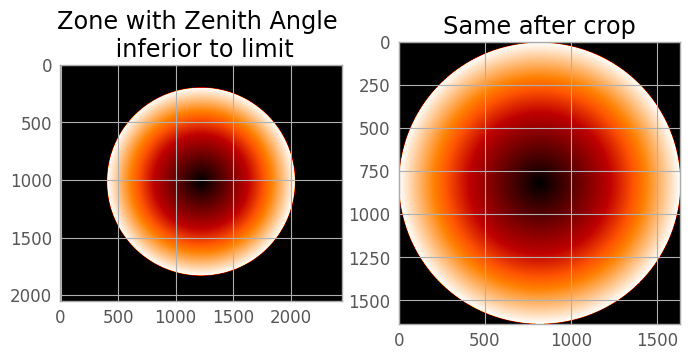

In [18]:
theta_big=orientation_ENU[:,:,1]
alpha_big=orientation_ENU[:,:,0]
thetab=theta_big.copy()
thetab[theta_big>limit_Zenith_Angle]=0

#limite_angle=0.45
crop_x_min=np.nonzero(thetab[:,:])[0].min()
crop_x_max=np.nonzero(thetab[:,:])[0].max()
crop_y_min=np.nonzero(thetab[:,:])[1].min()
crop_y_max=np.nonzero(thetab[:,:])[1].max()

print("crop_x_min,crop_x_max,crop_y_min,crop_y_max",crop_x_min,crop_x_max,crop_y_min,crop_y_max)
print("crop_x_min-crop_x_max,crop_y_min-crop_y_max",crop_x_min-crop_x_max,crop_y_min-crop_y_max)

crop_x_min=(crop_x_min//4-0)*4 # Ajust here
crop_x_max=(crop_x_max//4+1)*4
crop_y_min=(crop_y_min//4+0)*4
crop_y_max=(crop_y_max//4+1)*4

print("crop_x_min,crop_x_max,crop_y_min,crop_y_max",crop_x_min,crop_x_max,crop_y_min,crop_y_max)
print("crop_x_min-crop_x_max,crop_y_min-crop_y_max",crop_x_min-crop_x_max,crop_y_min-crop_y_max)

plt.figure()
plt.subplot(121)
plt.imshow(thetab)
plt.title("Zone with Zenith Angle \n inferior to limit")#
plt.subplot(122)
plt.imshow(thetab[crop_x_min:crop_x_max,crop_y_min:crop_y_max])
plt.title("Same after crop")
chemins_pos=dirs_files[300]
chemins=np.load(path+chemins_pos)
i_eme_image=7
chemin=chemins[i_eme_image]
print(chemin)
png_raw_name=path+chemin.split('ManipeResultats/')[1] #On reconstitue le chemin de chaque image en ne gardant 
#que la fin du chemin et en l'adaptant au systeme où le dépouillement est fait.

image_tot=np.load(png_raw_name+str(i_eme_image)+'.npy').astype('int64') #Enfin on charge l'image en question.
image_tot_delim=image_tot.copy()
image_tot_delim[theta_big>limit_Zenith_Angle]=image_tot_delim[theta_big>limit_Zenith_Angle]/3
image=image_tot[crop_x_min:crop_x_max,crop_y_min:crop_y_max].astype('uint16')

Define and save new orientation values of pixels in ENU frame

In [19]:
theta=orientation_ENU[:,:,1][crop_x_min:crop_x_max,crop_y_min:crop_y_max]
alpha=orientation_ENU[:,:,0][crop_x_min:crop_x_max,crop_y_min:crop_y_max]
##theta.shape
    
np.save(calib_path+"theta_crop.npy",theta)
np.save(calib_path+"alpha_crop.npy",alpha)

np.save(calib_path+"params_crop.npy",[crop_x_min,crop_x_max,crop_y_min,crop_y_max])

In [20]:
print(calib_path)

/scratch/lpoughon/PolarizedDatabase/calib/


An example on an image.

Text(0.5, 1.0, 'Image after crop')

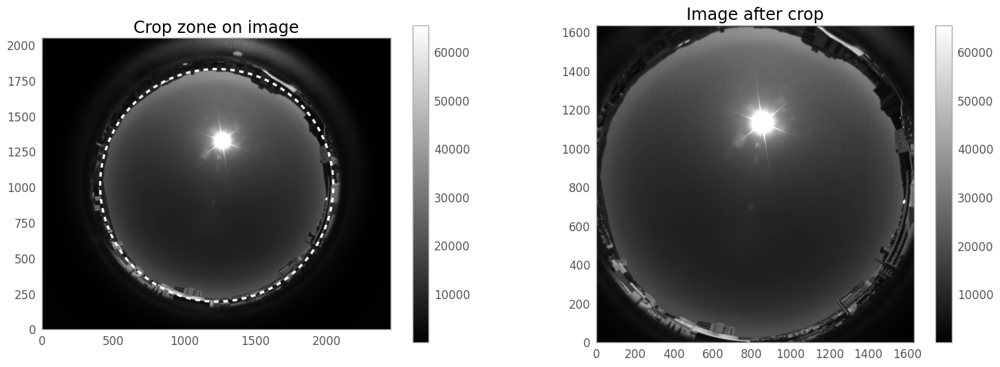

In [21]:
plt.figure(figsize=(18,6))

plt.subplot(121)
image_tot_r=np.load(png_raw_name+str(i_eme_image)+'.npy').astype('int64') #Enfin on charge l'image en question.
image_tot_r[np.where((theta_big>limit_Zenith_Angle-np.pi*0.005) & (theta_big<limit_Zenith_Angle+np.pi*0.005) & ((alpha_big%(np.pi/40)>(np.pi/80))))]=65520
plt.imshow(image_tot_r,cmap='gray',origin='lower')
plt.colorbar()
plt.grid(False)
plt.title("Crop zone on image")
plt.subplot(122)
#image[theta>limit_Zenith_Angle]=0
plt.imshow(image,cmap='gray',origin='lower')#<65520)
plt.grid(False)
plt.colorbar()
plt.title("Image after crop")

Corresponding orientations in ENU frame for reduced images

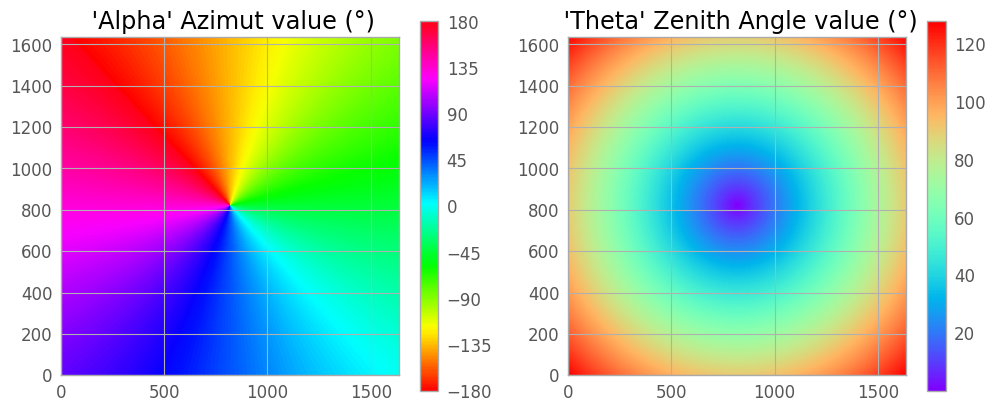

In [22]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.title(" 'Alpha' Azimut value (°)")

plt.imshow(alpha*180/np.pi,cmap='hsv',interpolation = 'none', origin='lower' )
cbar=plt.colorbar(boundaries=np.linspace(-180,180,361),ticks=[-180,-135,-90,-45,0,45,90,135,180],shrink=0.4)

plt.subplot(122)
plt.title(" 'Theta' Zenith Angle value (°)")

plt.imshow(theta*180/np.pi,cmap='rainbow',interpolation = 'none', origin='lower')
cbar=plt.colorbar(shrink=0.4)#boundaries=np.linspace(-180,180,361),ticks=[-180,-135,-90,-45,0,45,90,135,180])

plt.show()

In [23]:
eph=ephemeride.ephemerides() #Initialisation de la classe servant à calculer les ephemerides


In [24]:
dirs_files[0]

'2022-07-29T11-27-53.npy'

In [25]:
sorted_filenames_dict = {}

# Populate the dictionary with the sorted filenames
for filename in dirs_files:
    key = filename.split('T')[0]
    if key not in sorted_filenames_dict:
        sorted_filenames_dict[key] = []
    sorted_filenames_dict[key].append(filename)

In [26]:
image.dtype

dtype('uint16')

In [27]:
#image[image==1000]=65000
image_tot

array([[ 592, 1040,  432, ...,  256,  432,  192],
       [ 240,  528,  160, ...,  592,  752,  464],
       [ 384,  640,  240, ...,  224,  336,   96],
       ...,
       [ 976,  480,  752, ...,  736,  288,  416],
       [ 672,  416,  544, ...,  528,  448,  384],
       [ 880,  512,  704, ...,  432,  192,  192]])

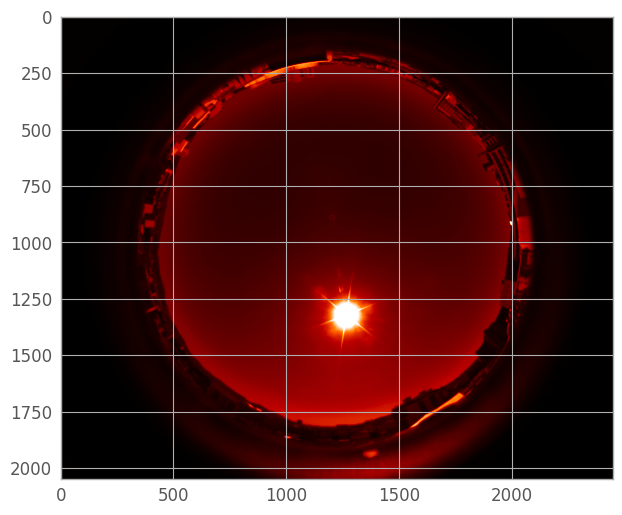

In [28]:
plt.imshow(image_tot)

In [29]:
print(image_tot.min())
print(image_tot.max())

16
65520


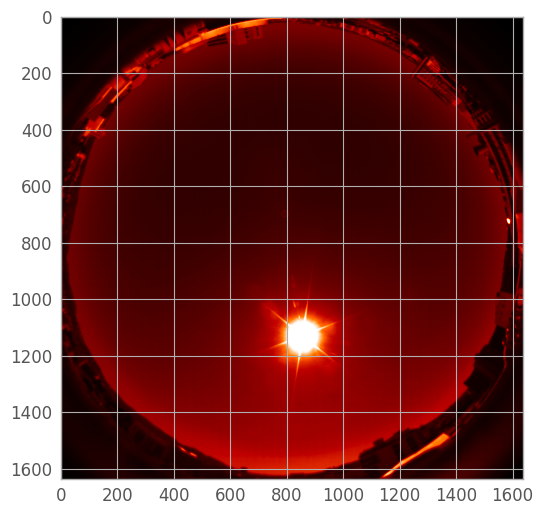

In [30]:
plt.imshow(image)

In [31]:
np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)

def process_acq(chemins_pos):
    chemins=np.load(path+chemins_pos)
    i=0
    liste=[]
    for chemin in chemins:
        liste.append(process_image(chemin,i))
        i+=1
    return liste

def process_image(chemin,i_eme_image):
    #faire une boucle for sur chemins !
    png_raw_name=path+chemin.split('ManipeResultats/')[1] #On reconstitue le chemin de chaque image en ne gardant que la fin du chemin et en l'adaptant au systeme où le dépuillement est fait.
    liste_expo=np.load(png_raw_name+"liste_expo"+'.npy') #On charge les temps d'exposition notés avec les images
    config_monture=np.load(png_raw_name+"config_monture.npy")

    (Psi_sun,Theta_sun)=eph.getAltAzSoleil(chemin.split('ManipeResultats/')[1]) #Calcul de l'ephemeride au moment de la prise de vue
    (Ha_sun,Dec_sun)=eph.getHADecSoleil(chemin.split('ManipeResultats/')[1]) #Calcul de l'ephemeride au moment de la prise de vue

    chainetps=chemin.split('ManipeResultats/')[1]
    chaineheure=chainetps.split("T")[1][0:-1].split("-")

    chainedate=chainetps.split('T')[0]

    heure_image=ephemeride.Time(chainetps.split("T")[0]+'T'+chaineheure[0]+":"+chaineheure[1]+":"+chaineheure[2])

    if int(chaineheure[0])<7 or int(chaineheure[0])>20:
        #print("continue : hours out of range : "+str(chaineheure))
        return None

    image_tot=np.load(png_raw_name+str(i_eme_image)+'.npy').astype('int64') #Enfin on charge l'image en question.

    image=image_tot[crop_x_min:crop_x_max,crop_y_min:crop_y_max].astype('uint16')

    #image[theta>limit_Zenith_Angle]=0

    degre_sat=np.count_nonzero(image>=65520)/(image.shape[0]*image.shape[1])

    if degre_sat>0.2:
    #    print("saturation :",degre_sat)
        return None#continue


    sortie=np.array([image,liste_expo[i_eme_image],chainetps[:-1],i_eme_image])
    return sortie

# Processing of images
It is done using multiprocessing python package, ajust num_processes to the number of CPU cores on your computer

In [32]:
for key in sorted_filenames_dict:
    print(key)
    tic=time.time()
    liste_jour=sorted_filenames_dict[key]
    num_processes=32*2
    results = (p_map(process_acq ,liste_jour,num_cpus=num_processes,tqdm=tqdm)) #[15000:15500:10]
    results = np.array([sublist for sublists in results for sublist in sublists if sublist is not None])
    np.save(out_path+key+"_raw.npy",results)
    print("Elapsed Time : ",time.time()-tic)


2022-07-29


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 76/76 [00:24<00:00,  3.16it/s]


Elapsed Time :  29.583595514297485
2022-07-30


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 134/134 [00:33<00:00,  3.96it/s]


Elapsed Time :  42.92003536224365
2022-07-31


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 137/137 [00:39<00:00,  3.45it/s]


Elapsed Time :  52.90786004066467
2022-08-01


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 128/128 [00:43<00:00,  2.92it/s]


Elapsed Time :  57.85842561721802
2022-08-02


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 136/136 [00:36<00:00,  3.76it/s]


Elapsed Time :  53.01088857650757
2022-08-03


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 133/133 [00:28<00:00,  4.66it/s]


Elapsed Time :  44.75348258018494
2022-08-04


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 139/139 [00:32<00:00,  4.26it/s]


Elapsed Time :  49.10876703262329
2022-08-05


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 138/138 [00:36<00:00,  3.76it/s]


Elapsed Time :  55.472862005233765
2022-08-06


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 140/140 [00:36<00:00,  3.85it/s]


Elapsed Time :  51.51806330680847
2022-08-07


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 138/138 [00:42<00:00,  3.27it/s]


Elapsed Time :  56.79790472984314
2022-08-08


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 137/137 [00:42<00:00,  3.19it/s]


Elapsed Time :  60.226197481155396
2022-08-09


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 138/138 [01:16<00:00,  1.80it/s]


Elapsed Time :  92.0567512512207
2022-08-10


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 142/142 [00:40<00:00,  3.52it/s]


Elapsed Time :  56.455689907073975
2022-08-11


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 139/139 [00:36<00:00,  3.76it/s]


Elapsed Time :  54.5300133228302
2022-08-12


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 138/138 [00:31<00:00,  4.41it/s]


Elapsed Time :  48.80068397521973
2022-08-13


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 138/138 [01:04<00:00,  2.15it/s]


Elapsed Time :  80.46668815612793
2022-08-14


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 141/141 [00:36<00:00,  3.82it/s]


Elapsed Time :  51.498701333999634
2022-08-15


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 142/142 [00:34<00:00,  4.07it/s]


Elapsed Time :  50.885952949523926
2022-08-16


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 136/136 [00:31<00:00,  4.37it/s]


Elapsed Time :  46.042574405670166
2022-08-17


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 141/141 [00:40<00:00,  3.52it/s]


Elapsed Time :  56.07620143890381
2022-08-18


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 141/141 [00:44<00:00,  3.14it/s]


Elapsed Time :  63.120327949523926
2022-08-19


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 137/137 [00:48<00:00,  2.84it/s]


Elapsed Time :  68.46441197395325
2022-08-20


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 141/141 [00:24<00:00,  5.79it/s]


Elapsed Time :  45.565590381622314
2022-08-21


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 138/138 [00:29<00:00,  4.63it/s]


Elapsed Time :  48.32552933692932
2022-08-22


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 137/137 [00:30<00:00,  4.55it/s]


Elapsed Time :  48.431241512298584
2022-08-23


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 139/139 [00:35<00:00,  3.91it/s]


Elapsed Time :  53.340885400772095
2022-08-24


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 139/139 [00:38<00:00,  3.59it/s]


Elapsed Time :  56.277793645858765
2022-08-25


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 137/137 [00:41<00:00,  3.34it/s]


Elapsed Time :  58.27029848098755
2022-08-26


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 134/134 [00:28<00:00,  4.71it/s]


Elapsed Time :  46.71978163719177
2022-08-27


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 135/135 [00:29<00:00,  4.62it/s]


Elapsed Time :  48.85927152633667
2022-08-28


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 134/134 [00:41<00:00,  3.20it/s]


Elapsed Time :  61.91665768623352
2022-08-29


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:15<00:00,  2.53it/s]


Elapsed Time :  29.1455237865448


In [33]:
for key in sorted_filenames_dict.keys():
    print(key)

2022-07-29
2022-07-30
2022-07-31
2022-08-01
2022-08-02
2022-08-03
2022-08-04
2022-08-05
2022-08-06
2022-08-07
2022-08-08
2022-08-09
2022-08-10
2022-08-11
2022-08-12
2022-08-13
2022-08-14
2022-08-15
2022-08-16
2022-08-17
2022-08-18
2022-08-19
2022-08-20
2022-08-21
2022-08-22
2022-08-23
2022-08-24
2022-08-25
2022-08-26
2022-08-27
2022-08-28
2022-08-29


Show animation of images a choosen day with a choosen exposure type

In [27]:
res=np.load(out_path+"2022-08-15"+"_raw.npy",allow_pickle=True)
video = res[res[:,3]==5,0]

In [28]:
video.shape
res[res[:,3]==5,1]
#plt.imshow(res[res[200,3]==5,0])

array([33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456,
       33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456,
       33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456,
       33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456,
       33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456,
       33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456,
       33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456,
       33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456,
       33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456,
       33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456, 33.456,
       33.456, 33.456], dtype=object)

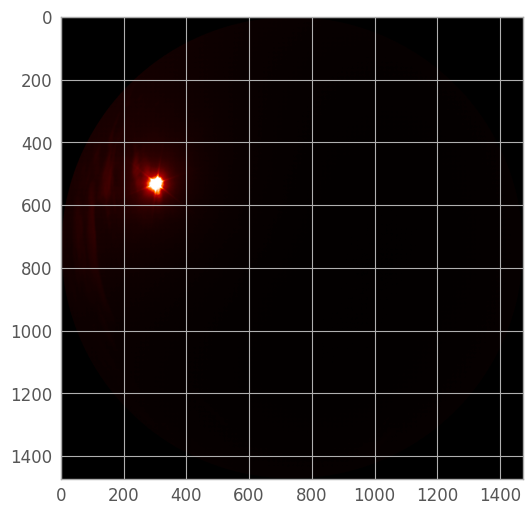

In [29]:
plt.imshow(res[res[:,3]==5,0][20])

In [30]:
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import animation
from IPython.display import HTML



fig = plt.figure()
im = plt.imshow(video[0])


plt.close() # this is required to not display the generated image

def init():
    im.set_data(video[0])

def animate(i):
    im.set_data(video[i])
    #fig.title(results[results[:,3]==0,0])
    #print(i,video[i][600,950])
    return im

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=video.shape[0],
                               interval=50)
#HTML(anim.to_html5_video())
display(HTML(anim.to_jshtml()))

In [26]:
res[0]

array([array([[0, 0, 0, ..., 0, 0, 0],
              [0, 0, 0, ..., 0, 0, 0],
              [0, 0, 0, ..., 0, 0, 0],
              ...,
              [0, 0, 0, ..., 0, 0, 0],
              [0, 0, 0, ..., 0, 0, 0],
              [0, 0, 0, ..., 0, 0, 0]], dtype=uint16), 4550.712,
       '2022-08-23T07-00-15', 0], dtype=object)